## Subnetworks using queries

All spatial networks constructed using objects in MuSpAn use a consistent indexing system for node identification that we call `Object ID`. Our querying infrustructure allows users to filter their data without explictly knowing anything about the object IDs associated with each object in their domain. We leverage this framework to filter out networks using the metadata ('labels','collections',etc) corresponding the objects that form our networks. 

A network constructed from removing edges and nodes a larger network are called subnetworks. Subnetworks are useful to isolate structure around specific nodes in a much larger network and can be used to identify network motifs (repeating network sub-structures in a large network). Let's see how we can combine our networks and querying infrastructure to build spatial subnetworks.

We'll do this using one of our sample datasets: `Synthetic-Points-Architecture`


MuSpAn domain loaded successfully. Domain summary:
Domain name: Architecture
Number of objects: 5991
Collections: ['Cell centres']
Labels: ['Celltype'] 
Networks: [] 
Distance matrices: []


(<Figure size 2700x2160 with 2 Axes>, <Axes: >)

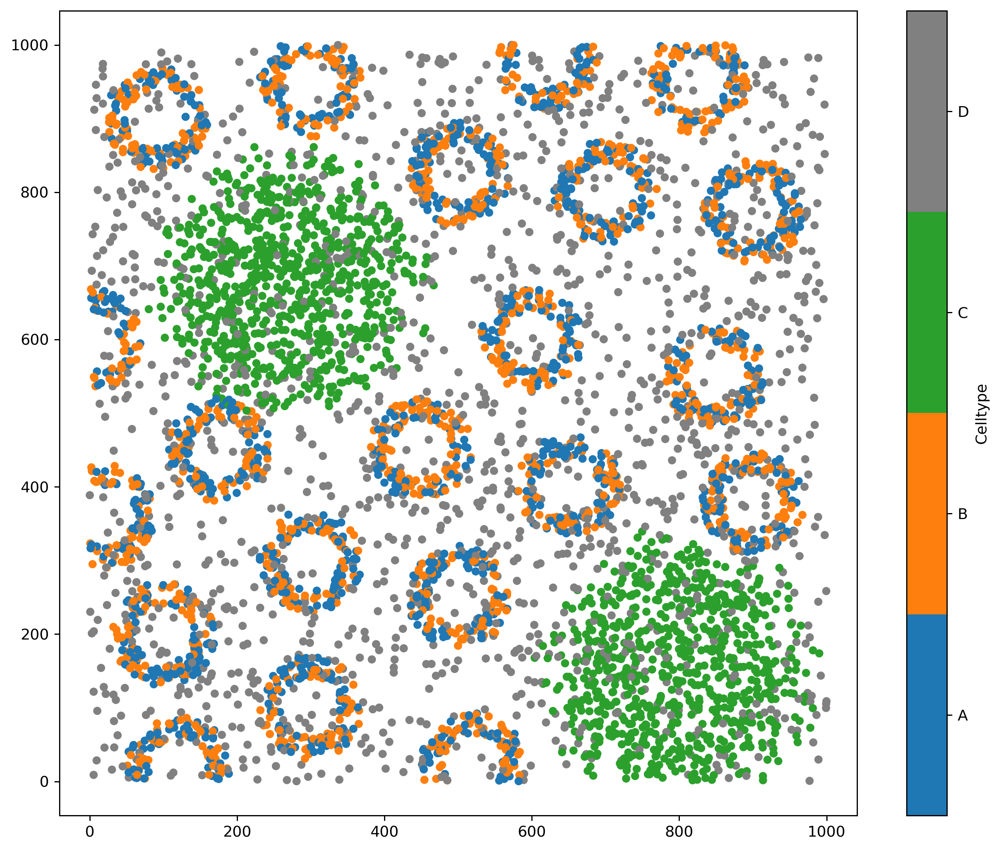

In [1]:
# Import necessary libraries
import muspan as ms
import matplotlib.pyplot as plt 

# Set the resolution of the plots
plt.rcParams['figure.dpi'] = 270

# Load the example domain dataset
example_domain = ms.datasets.load_example_domain('Synthetic-Points-Architecture')

# Visualise the example domain, coloring by 'Celltype'
ms.visualise.visualise(example_domain, color_by='Celltype')

We can first build a network that we will use to filter down to construct some subnetworks. We'll call this 'Large network' and edges will be defined using the 'Delaunay' method.

(<Figure size 3510x2160 with 2 Axes>, <Axes: >)

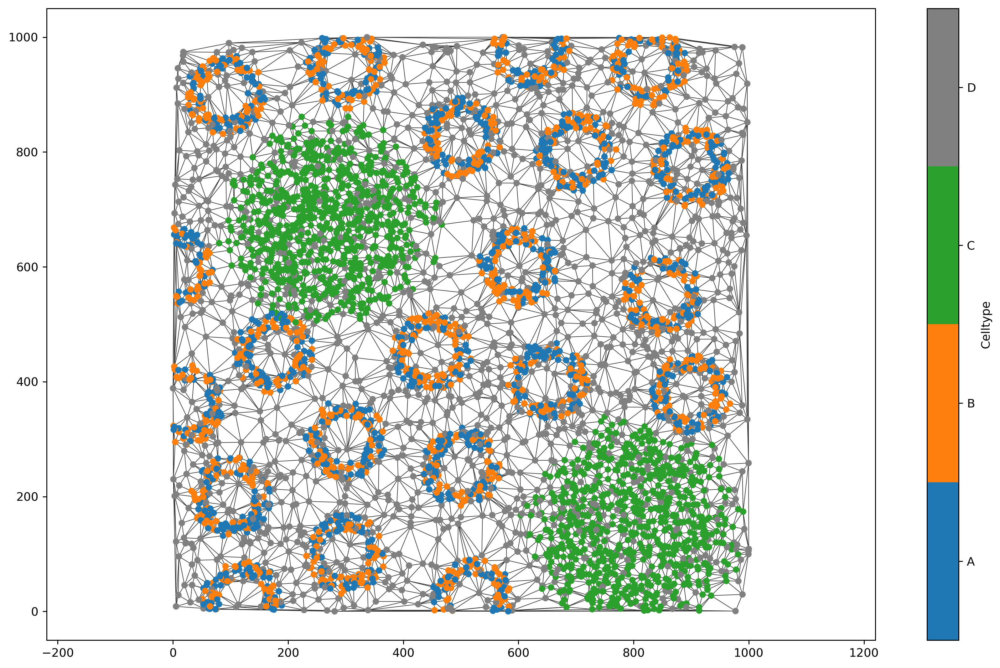

In [2]:
# Generate a 'Large network' using the 'Delaunay' method
ms.networks.generate_network(example_domain, network_name='Large network', network_type='Delaunay')

# Visualize the 'Large network'
ms.visualise.visualise_network(
    example_domain, 
    network_name='Large network', 
    edge_width=0.5, 
    figure_kwargs={'figsize': (13, 8)}, 
    visualise_kwargs=dict(color_by='Celltype')
)

Now we have a network, let's generatate a query on our MuSpAn objects. Say we want to exclude the edges and nodes produced by points with label 'D', we can generate the following query:

In [3]:
# Generate a query to exclude points with 'Celltype' labels 'A', 'B', or 'C'
query_exclude_d = ms.query.query(example_domain, ('label', 'Celltype'), 'in', ['A', 'B', 'C'])

Remember that 'query_exclude_d' will only return the relevent object IDs after it has been interpreted with our query interpreter. Let's get a list of these objects IDs that relate to all points with Celtype labels 'A', 'B' or 'C'. See our tutorials on 'Queries' for more information about how to query your spatial data effectively.

In [4]:
# Interpret the query to get the object IDs for points with 'Celltype' labels 'A', 'B', or 'C'
query_exclude_d_ids = ms.query.return_object_IDs_from_query_like(example_domain,query_exclude_d)

# Print the resulting object IDs
print(query_exclude_d_ids)

[   0    1    2 ... 4413 4414 4415]


Now we have the IDs of the objects in our query, we can use the 'subgraph' feature of the networkX networks to retrieve our filtered networks. This works by passing in the node IDs of interest to the subgraph argument.

In [5]:
# Retrieve the 'Large network' from the example domain
example_network = example_domain.networks['Large network']    

# Create a subgraph using the object IDs from our query (points with 'Celltype' labels 'A', 'B', or 'C')
example_subnetwork_ABC = example_network.subgraph(query_exclude_d_ids)

# Add the subgraph to the domain's networks and name it 'Subnetwork ABC'
example_domain.networks['Subnetwork ABC'] = example_subnetwork_ABC  # Optional: save the network to the domain for later use


We should check this has filtered down our network as we expected:

(<Figure size 4050x1890 with 3 Axes>,
 <Axes: title={'center': 'Subnetwork ABC'}>)

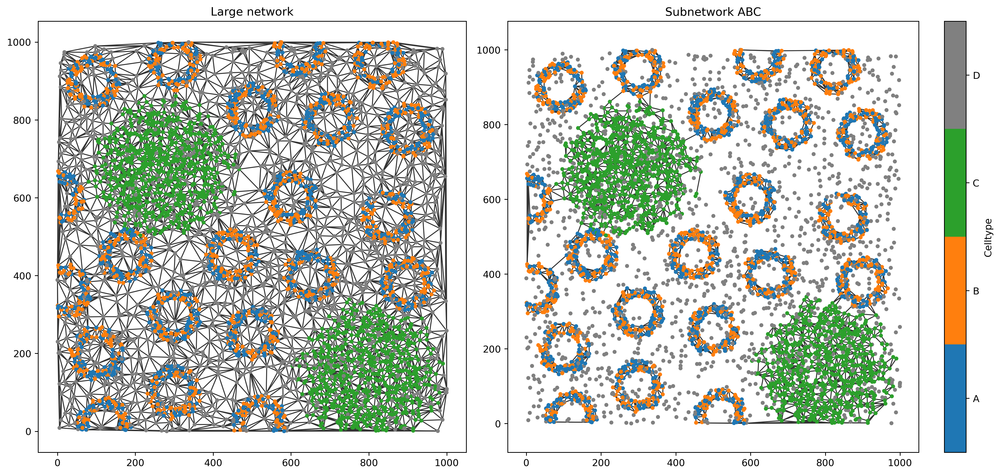

In [6]:
# Create a figure with two subplots
fig, ax = plt.subplots(1, 2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1.2]})

# Plot the 'Large network' on the first subplot
ax[0].set_title('Large network')
ms.visualise.visualise_network(
    example_domain,
    network_name='Large network',
    edge_weight_name=None,
    ax=ax[0],
    visualise_kwargs=dict(add_cbar=False, color_by=('label', 'Celltype'), marker_size=10)
)

# Plot the 'Subnetwork ABC' on the second subplot
ax[1].set_title('Subnetwork ABC')
ms.visualise.visualise_network(
    example_domain,
    network_name='Subnetwork ABC',
    ax=ax[1],
    edge_weight_name=None,
    visualise_kwargs=dict(color_by=('label', 'Celltype'), marker_size=10)
)

Great, now we're left with edges only between objects with 'Celltype' labels 'A', 'B' and 'C'. 

From the generality of the query infrastructure and networks, all weird and wondering combinations can be defined to pull out structural information from out spatial data. For example, get a subnetwork of all nodes with labels 'A', 'B' and within 100μm from label 'C'.

(<Figure size 4050x1890 with 3 Axes>,
 <Axes: title={'center': 'Subnetwork: points A or B and within 100μm distance of C'}>)

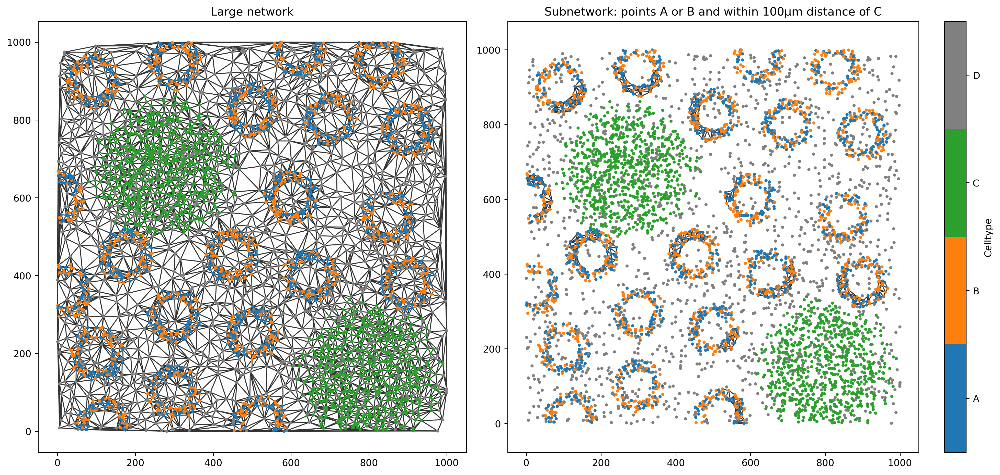

In [7]:
# Generate queries for points with 'Celltype' labels 'A' and 'B'
query_ab = ms.query.query(example_domain, ('label', 'Celltype'), 'in', ['A', 'B'])

# Generate a query for points with 'Celltype' label 'C'
query_c = ms.query.query(example_domain, ('label', 'Celltype'), 'is', 'C')

# Generate a query for points within 100μm distance from points with 'Celltype' label 'C'
query_distance_c = ms.query.query(example_domain, ('distance', ('centroid', query_ab, query_c)), '<', 100)

# Combine the two queries with AND to get points with 'Celltype' labels 'A' or 'B' and within 100μm distance of 'C'
query_distance_ab = ms.query.query_container(query_distance_c, 'AND', query_ab)

# Interpret the combined query to get the object IDs
query_distance_ab_ids = ms.query.interpret_query(query_distance_ab)

# Create a subnetwork using the object IDs from the combined query
example_subnetwork_extended = example_network.subgraph(query_distance_ab_ids)

# Add the subnetwork to the domain's networks and name it 'Subnetwork extended query'
example_domain.networks['Subnetwork extended query'] = example_subnetwork_extended  # Optional: save the network to the domain for later use

# Plot the 'Large network' and the 'Subnetwork extended query'
fig, ax = plt.subplots(1, 2, figsize=(15, 7), gridspec_kw={'width_ratios': [1, 1.2]})

# Plot the 'Large network' on the first subplot
ax[0].set_title('Large network')
ms.visualise.visualise_network(
    example_domain,
    network_name='Large network',
    ax=ax[0],
    edge_weight_name=None,
    visualise_kwargs=dict(color_by=('label', 'Celltype'), marker_size=5, add_cbar=False)
)

# Plot the 'Subnetwork extended query' on the second subplot
ax[1].set_title('Subnetwork: points A or B and within 100μm distance of C')
ms.visualise.visualise_network(
    example_domain,
    network_name='Subnetwork extended query',
    ax=ax[1],
    edge_weight_name=None,
    visualise_kwargs=dict(color_by=('label', 'Celltype'), marker_size=5)
)

This is a little hard to see but we now can find only edges between the blue and orange points that are in close proximity to the green clusters of points.

This example demonstrates how MuSpAn provides a powerful framework for spatial network analysis by embedding the contexual information of the dataset within the well-established backend of NetworkX.